<a href="https://colab.research.google.com/github/fitrieratna/DataScience-Portfolio/blob/master/Customer%20Segmentation%20Case%20use%20Dimensionality%20Reduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Customer Segmentation**



# Load Data & Data Description


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import chardet

In [3]:
# To connect Google Drive (GDrive) with Colab
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [4]:
data = pd.read_csv('/content/gdrive/My Drive/Data Source/Cust_Segmentation.csv')

In [5]:
data.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,Address,DebtIncomeRatio
0,1,41,2,6,19,0.124,1.073,0.0,NBA001,6.3
1,2,47,1,26,100,4.582,8.218,0.0,NBA021,12.8
2,3,33,2,10,57,6.111,5.802,1.0,NBA013,20.9
3,4,29,2,4,19,0.681,0.516,0.0,NBA009,6.3
4,5,47,1,31,253,9.308,8.908,0.0,NBA008,7.2


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 850 entries, 0 to 849
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Customer Id      850 non-null    int64  
 1   Age              850 non-null    int64  
 2   Edu              850 non-null    int64  
 3   Years Employed   850 non-null    int64  
 4   Income           850 non-null    int64  
 5   Card Debt        850 non-null    float64
 6   Other Debt       850 non-null    float64
 7   Defaulted        700 non-null    float64
 8   Address          850 non-null    object 
 9   DebtIncomeRatio  850 non-null    float64
dtypes: float64(4), int64(5), object(1)
memory usage: 66.5+ KB


In [7]:
missing_data = data.isnull()

for column in missing_data.columns.values.tolist():
 print (column)
 print (missing_data[column].value_counts())
 print("")  

Customer Id
False    850
Name: Customer Id, dtype: int64

Age
False    850
Name: Age, dtype: int64

Edu
False    850
Name: Edu, dtype: int64

Years Employed
False    850
Name: Years Employed, dtype: int64

Income
False    850
Name: Income, dtype: int64

Card Debt
False    850
Name: Card Debt, dtype: int64

Other Debt
False    850
Name: Other Debt, dtype: int64

Defaulted
False    700
True     150
Name: Defaulted, dtype: int64

Address
False    850
Name: Address, dtype: int64

DebtIncomeRatio
False    850
Name: DebtIncomeRatio, dtype: int64



# Data Preprocessing & Exploratory Data Analysis




```
 1. Drop unused column
```



In [8]:
df = data.drop(['Address','Defaulted'], axis=1)
df.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,1,41,2,6,19,0.124,1.073,6.3
1,2,47,1,26,100,4.582,8.218,12.8
2,3,33,2,10,57,6.111,5.802,20.9
3,4,29,2,4,19,0.681,0.516,6.3
4,5,47,1,31,253,9.308,8.908,7.2




```
2. Correlation of Attributes
```



In [9]:
#Find correlation of 

float_columns = [x for x in df.columns if x not in ['Customer Id']]
corr_mat = df[float_columns].corr()

# Strip out the diagonal values for the next step
for x in range(len(float_columns)):
    corr_mat.iloc[x,x] = 0.0
    
corr_mat

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
Age,0.000000,0.012983,0.554241,0.476218,0.278912,0.337839,0.008240
Edu,0.012983,0.000000,-0.151117,0.218219,0.099081,0.140938,0.008053
Years Employed,0.554241,-0.151117,0.000000,0.625093,0.381744,0.414430,-0.033625
Income,0.476218,0.218219,0.625093,0.000000,0.551510,0.603356,-0.035585
Card Debt,0.278912,0.099081,0.381744,0.551510,0.000000,0.644955,0.514971
Other Debt,0.337839,0.140938,0.414430,0.603356,0.644955,0.000000,0.572545
DebtIncomeRatio,0.008240,0.008053,-0.033625,-0.035585,0.514971,0.572545,0.000000


In [10]:
corr_mat.abs().idxmax()

Age                Years Employed
Edu                        Income
Years Employed             Income
Income             Years Employed
Card Debt              Other Debt
Other Debt              Card Debt
DebtIncomeRatio        Other Debt
dtype: object

In [11]:
skew_columns = (df[float_columns]
                .skew()
                .sort_values(ascending=False))

skew_columns = skew_columns.loc[skew_columns > 0.75]
skew_columns

#Note that skewness>0.75 is considered as heavy skew so that we need to transform it to log before feature scaling to help standardized the data

Card Debt          3.701790
Income             3.700761
Other Debt         3.206006
Edu                1.216846
DebtIncomeRatio    1.124999
Years Employed     0.862663
dtype: float64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


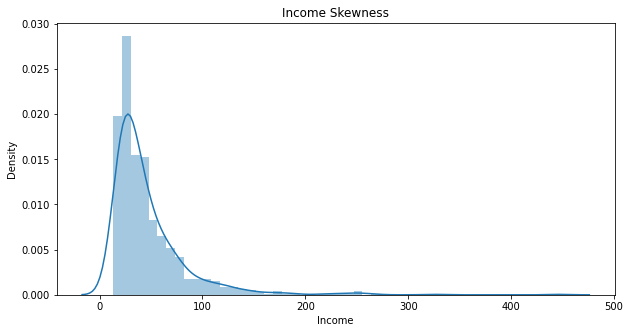

In [12]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Income'])
plt.title('Income Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


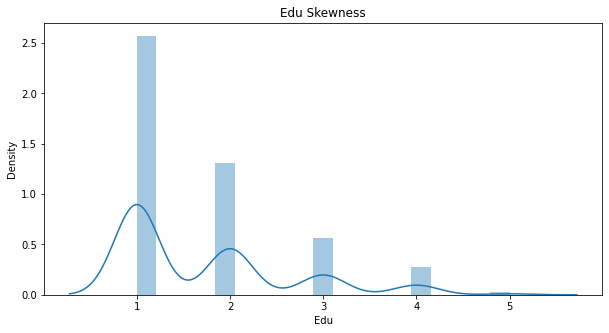

In [13]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Edu'])
plt.title('Edu Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


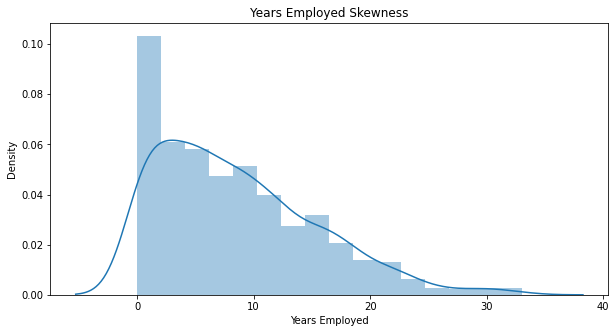

In [14]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Years Employed'])
plt.title('Years Employed Skewness')
plt.show()

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


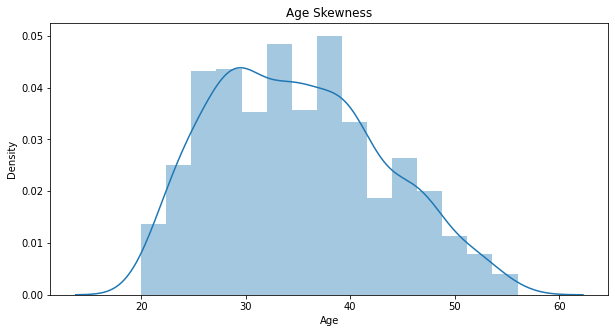

In [15]:
import seaborn as sns

plt.figure(figsize=(10,5))
sns.distplot(df['Age'])
plt.title('Age Skewness')
plt.show()

In [16]:
# Perform log transform on skewed columns
for col in skew_columns.index.tolist():
    df[col] = np.log1p(df[col])
    

In [17]:
df[float_columns]

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,41,1.098612,1.945910,2.995732,0.116894,0.728997,1.987874
1,47,0.693147,3.295837,4.615121,1.719547,2.221158,2.624669
2,33,1.098612,2.397895,4.060443,1.961643,1.917217,3.086487
3,29,1.098612,1.609438,2.995732,0.519389,0.416075,1.987874
4,47,0.693147,3.465736,5.537334,2.332920,2.293343,2.104134
...,...,...,...,...,...,...,...
845,27,0.693147,1.791759,3.295837,0.436964,0.797507,2.054124
846,28,1.098612,2.079442,3.555348,0.306749,1.105588,2.079442
847,25,1.609438,0.000000,2.944439,1.335527,1.437463,3.538057
848,32,0.693147,2.564949,3.367296,0.109751,0.528273,1.360977




```
2. Feature Scaling


In [18]:
# Feature Scaling using Standard Scaler

from sklearn.preprocessing import StandardScaler

sc = StandardScaler()
df[float_columns] = df[float_columns]
df[float_columns] = sc.fit_transform(df[float_columns])

df.head()

#data[float_columns] = sc.fit_transform(data[float_columns])

#data.head(4)

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441


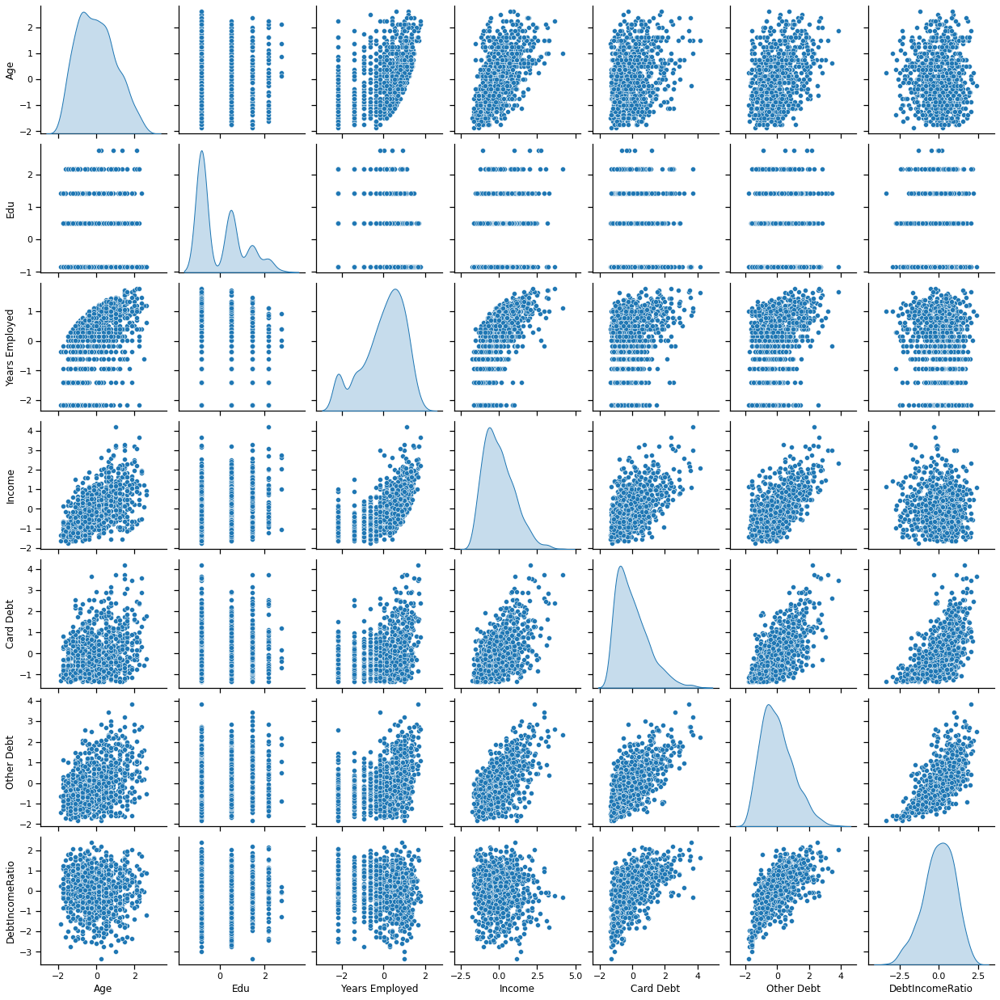

In [20]:
sns.set_context('notebook')

sns.pairplot(df[float_columns], diag_kind='kde');


# **Dimensionality Reduction**
a. PCA

In [21]:
from sklearn.decomposition import PCA

pca_list = list()
feature_weight_list = list()

# Fit a range of PCA models

for n in range(1, 6):
    
    # Create and fit the model
    PCAmod = PCA(n_components=n)
    PCAmod.fit(df[float_columns])

In [22]:
np.abs(PCAmod.components_).sum(axis=0) #nilai feature importance dari Dimensi 1 sampai dimensi 6 di keenam features

array([1.69298486, 1.27843428, 1.72961418, 1.31117013, 1.69333175,
       1.2999069 , 1.49604785])

In [23]:
from sklearn.decomposition import PCA

pca_list = list()
feature_weight_list = list()

# Fit a range of PCA models

for n in range(1, 7):
    
    # Create and fit the model
    PCAmod = PCA(n_components=n)
    PCAmod.fit(df[float_columns])
    
    # Store the model and variance
    pca_list.append(pd.Series({'n':n, 'model':PCAmod,
                               'var': PCAmod.explained_variance_ratio_.sum()}))
    
    # Calculate and store feature importances
    abs_feature_values = np.abs(PCAmod.components_).sum(axis=0)
    feature_weight_list.append(pd.DataFrame({'n':n, 
                                             'features': df[float_columns].columns,
                                             'values':abs_feature_values/abs_feature_values.sum()}))
    
pca_df = pd.concat(pca_list, axis=1).T.set_index('n')
pca_df

,model,var
n,,
1,"PCA(copy=True, iterated_power='auto', n_compon...",0.445759
2,"PCA(copy=True, iterated_power='auto', n_compon...",0.673836
3,"PCA(copy=True, iterated_power='auto', n_compon...",0.82967
4,"PCA(copy=True, iterated_power='auto', n_compon...",0.904387
5,"PCA(copy=True, iterated_power='auto', n_compon...",0.956479
6,"PCA(copy=True, iterated_power='auto', n_compon...",0.996378


In [24]:
PCAmod.explained_variance_ratio_

array([0.44575904, 0.22807675, 0.15583418, 0.07471693, 0.05209186,
       0.03989959])

In [25]:
feature_weight_list[2]

,n,features,values
0,3,Age,0.115019
1,3,Edu,0.170281
2,3,Years Employed,0.158459
3,3,Income,0.150866
4,3,Card Debt,0.111821
5,3,Other Debt,0.119730
6,3,DebtIncomeRatio,0.173825


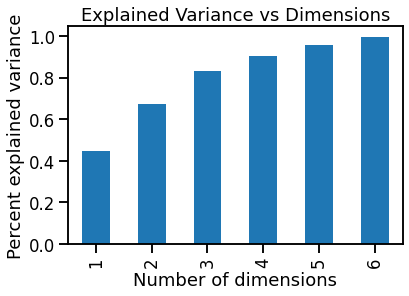

In [26]:
sns.set_context('talk')
ax = pca_df['var'].plot(kind='bar')

ax.set(xlabel='Number of dimensions',
       ylabel='Percent explained variance',
       title='Explained Variance vs Dimensions');

In [27]:
features_df = (pd.concat(feature_weight_list)
               .pivot(index='n', columns='features',values='values'))

features_df

features,Age,Card Debt,DebtIncomeRatio,Edu,Income,Other Debt,Years Employed
n,,,,,,,
1,0.145158,0.184579,0.107419,0.032768,0.188980,0.196331,0.144766
2,0.148318,0.145648,0.186126,0.041875,0.156935,0.155999,0.165100
3,0.115019,0.111821,0.173825,0.170281,0.150866,0.119730,0.158459
4,0.189664,0.109100,0.154276,0.135695,0.147734,0.094021,0.169510
5,0.161214,0.161247,0.142461,0.121738,0.124856,0.123783,0.164702
6,0.138846,0.143232,0.137538,0.126548,0.141932,0.129909,0.181994


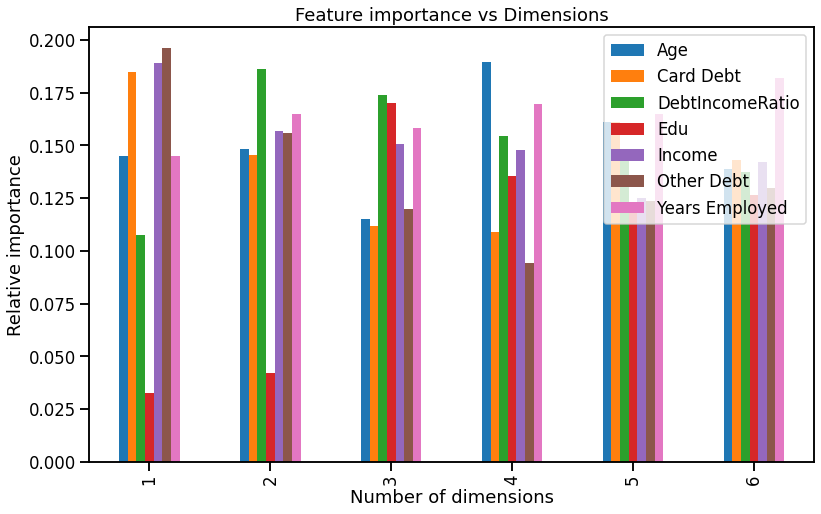

In [28]:
ax = features_df.plot(kind='bar', figsize=(13,8))
ax.legend(loc='upper right')
ax.set(xlabel='Number of dimensions',
       ylabel='Relative importance',
       title='Feature importance vs Dimensions');

In [29]:
#Use 4 features for PCA

from sklearn.decomposition import PCA
PCAinstance = PCA(n_components=4)
X_trans = PCAinstance.fit_transform(df[float_columns])

In [30]:
X_trans #X_trans is for PCA

array([[-1.21089255,  0.60803818,  0.30082911,  1.09766639],
       [ 3.53953608,  0.51356404, -1.02074015, -0.00905821],
       [ 2.37144096, -1.47043392,  0.10015484, -0.77282744],
       ...,
       [-0.40897084, -3.77735178,  1.73588295,  0.30201593],
       [-1.59812494,  1.59132214, -0.65908617, -0.47706223],
       [ 1.98874662,  1.26119346, -0.90201634,  1.05667167]])

b. **Kernel PCA**

In [53]:
from sklearn.decomposition import KernelPCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Custom scorer--use negative rmse of inverse transform
def scorer(pcamodel, X, y=None):

    try:
        X_val = X.values
    except:
        X_val = X
        
    # Calculate and inverse transform the data
    data_inv = pcamodel.fit(X_val).transform(X_val)
    data_inv = pcamodel.inverse_transform(data_inv)
    
    # The error calculation
    mse = mean_squared_error(data_inv.ravel(), X_val.ravel())
    
    # Larger values are better for scorers, so take negative value
    return -1.0 * mse

# The grid search parameters
param_grid = {'gamma':[0.001, 0.01, 0.05, 0.1, 0.5, 1.0],
              'n_components': [2, 3, 4]}

# The grid search
kernelPCA = GridSearchCV(KernelPCA(kernel='rbf', fit_inverse_transform=True),
                         param_grid=param_grid,
                         scoring=scorer,
                         n_jobs=-1)


kernelPCA = kernelPCA.fit(df[float_columns])

kernelPCA.best_estimator_

KernelPCA(alpha=1.0, coef0=1, copy_X=True, degree=3, eigen_solver='auto',
          fit_inverse_transform=True, gamma=0.1, kernel='rbf',
          kernel_params=None, max_iter=None, n_components=4, n_jobs=None,
          random_state=None, remove_zero_eig=False, tol=0)

In [54]:
from sklearn.decomposition import KernelPCA
import numpy 

kpca_list = list()
kfeature_weight_list = list()

# Fit a range of PCA models

for n in range(1, 7):
    
    # Create and fit the model
    kPCAmod = KernelPCA(n_components=n)
    kPCAmod.fit(df[float_columns])
    
    # Store the model and variance
    kpca_transform = kPCAmod.fit_transform(df[float_columns])
    k_explained_variance = numpy.var(kpca_transform, axis=0)
    k_explained_variance_ratio = k_explained_variance / numpy.sum(k_explained_variance)

   
  

In [55]:
k_explained_variance_ratio

array([0.44737929, 0.22890576, 0.15640061, 0.07498851, 0.0522812 ,
       0.04004462])

In [34]:
#Create dataframe for Kernel PCA of n_components and its variance
d = {'n': [1,2,3,4,5,6], 'Var':[0.44, 0.675, 0.83, 0.90, 0.95, 1]}

var_kpca = pd.DataFrame(data=d)
print(var_kpca.to_string(index=False))
#var_kpca
        

 n    Var
 1  0.440
 2  0.675
 3  0.830
 4  0.900
 5  0.950
 6  1.000


In [35]:
np.allclose(PCAmod.explained_variance_ratio_, k_explained_variance_ratio)

False

In [56]:
#Use 4 features for kernel PCA

from sklearn.decomposition import KernelPCA
kPCA = KernelPCA(n_components=4, kernel='rbf', gamma=0.1)
X_transKPCA = kPCA.fit_transform(df[float_columns])

# Clustering Model

## 1. K Means


**A. Without using Dimensionality Reduction**






In [38]:
from sklearn.cluster import KMeans
### BEGIN SOLUTION
# Create and fit a range of models
km_list = list()

for clust in range(2,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df[float_columns])
    
    km_list.append(pd.Series({'clusters': clust, 
                              'inertia': km.inertia_,
                              'model': km}))

In [39]:
from pandas import DataFrame
df_km_list = DataFrame(km_list)
df_km_list

,clusters,inertia,model
0,2,4173.591773,"KMeans(algorithm='auto', copy_x=True, init='k-..."
1,3,3521.013613,"KMeans(algorithm='auto', copy_x=True, init='k-..."
2,4,3153.485936,"KMeans(algorithm='auto', copy_x=True, init='k-..."
3,5,2859.244149,"KMeans(algorithm='auto', copy_x=True, init='k-..."
4,6,2641.352830,"KMeans(algorithm='auto', copy_x=True, init='k-..."
5,7,2478.389518,"KMeans(algorithm='auto', copy_x=True, init='k-..."
6,8,2343.218884,"KMeans(algorithm='auto', copy_x=True, init='k-..."
7,9,2211.763829,"KMeans(algorithm='auto', copy_x=True, init='k-..."
8,10,2123.743688,"KMeans(algorithm='auto', copy_x=True, init='k-..."
9,11,2039.350561,"KMeans(algorithm='auto', copy_x=True, init='k-..."


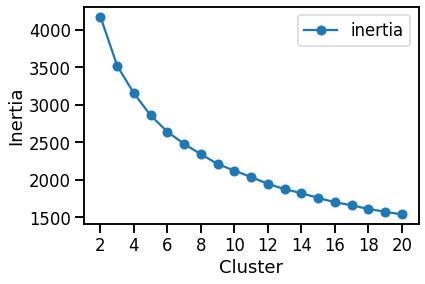

In [40]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(1,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

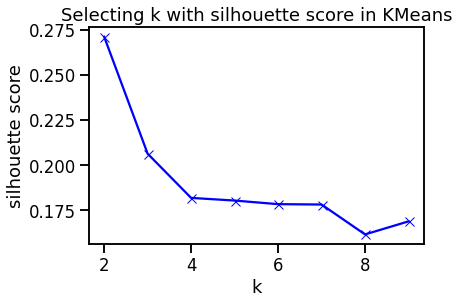

In [44]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

meanDistortions=[]

for k in range(2, 10):
    kmeans_model=KMeans(n_clusters=k, random_state=42)
    kmeans_model.fit(df[float_columns])
    prediction=kmeans_model.labels_
    meanDistortions.append(silhouette_score(df[float_columns], prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in KMeans');

In [47]:
from sklearn.cluster import KMeans
### BEGIN SOLUTION

X = df[float_columns]
km3_conv = KMeans(n_clusters=3, random_state=42)
km3_conv = km3_conv.fit(X)

df['kmeans'] = km3_conv.predict(X)

In [145]:
df['kmeans'].value_counts().to_frame().rename(columns={'kmeans':'number'})

,number
0,301
1,280
2,269


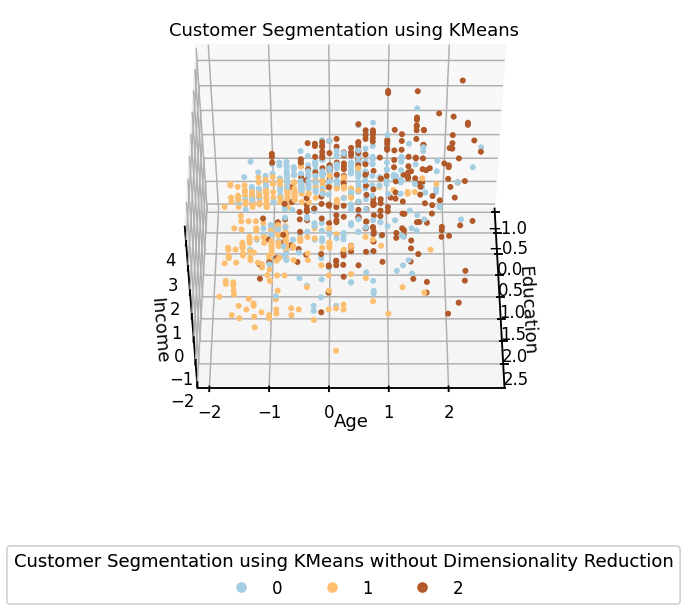

In [50]:
from mpl_toolkits.mplot3d import Axes3D

import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df.values[:,1:]

ax.set_title("Customer Segmentation using KMeans")
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= km3_conv.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using KMeans without Dimensionality Reduction", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())


In [51]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=2): {silhouette_score(df[float_columns], km3_conv.labels_)}')

Silhouette Score(n=2): 0.20640018096655668


**B. Using PCA as Dimensionality Reduction**

In [57]:
df_XtransPCA = pd.DataFrame(X_trans)
df_XtransPCA.head()

,0,1,2,3
0,-1.210893,0.608038,0.300829,1.097666
1,3.539536,0.513564,-1.020740,-0.009058
2,2.371441,-1.470434,0.100155,-0.772827
3,-1.793769,-0.154993,0.430587,-0.153221
4,4.693605,1.286995,-0.547095,-0.830720


In [58]:
### BEGIN SOLUTION
# Create and fit a range of models
km_list = list()

for clust in range(3,21):
    km = KMeans(n_clusters=clust, random_state=42)
    km = km.fit(df_XtransPCA)
    
    km_list.append(pd.Series({'clusters': clust, 
                              'inertia': km.inertia_,
                              'model': km}))

In [59]:
from pandas import DataFrame
df_km_list = DataFrame(km_list)
df_km_list

,clusters,inertia,model
0,3,2954.482979,"KMeans(algorithm='auto', copy_x=True, init='k-..."
1,4,2597.730960,"KMeans(algorithm='auto', copy_x=True, init='k-..."
2,5,2302.986329,"KMeans(algorithm='auto', copy_x=True, init='k-..."
3,6,2103.704594,"KMeans(algorithm='auto', copy_x=True, init='k-..."
4,7,1930.584425,"KMeans(algorithm='auto', copy_x=True, init='k-..."
5,8,1796.587775,"KMeans(algorithm='auto', copy_x=True, init='k-..."
6,9,1679.025423,"KMeans(algorithm='auto', copy_x=True, init='k-..."
7,10,1594.059135,"KMeans(algorithm='auto', copy_x=True, init='k-..."
8,11,1506.456765,"KMeans(algorithm='auto', copy_x=True, init='k-..."
9,12,1426.115695,"KMeans(algorithm='auto', copy_x=True, init='k-..."


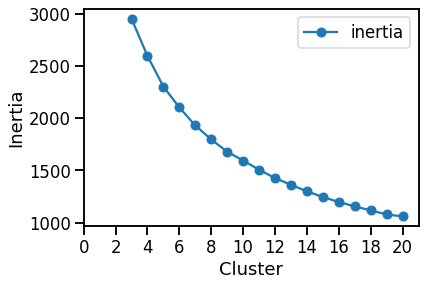

In [60]:
plot_data = (pd.concat(km_list, axis=1)
             .T
             [['clusters','inertia']]
             .set_index('clusters'))

ax = plot_data.plot(marker='o',ls='-')
ax.set_xticks(range(0,21,2))
ax.set_xlim(0,21)
ax.set(xlabel='Cluster', ylabel='Inertia');
### END SOLUTION

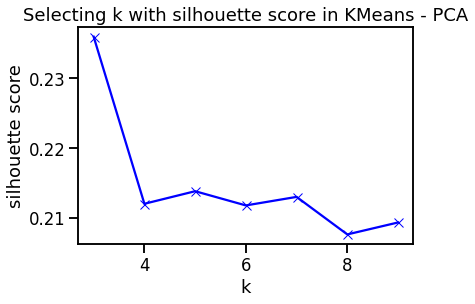

In [146]:
from sklearn.cluster import KMeans


meanDistortions=[]

for k in range(3, 10):
    kmeans_model=KMeans(n_clusters=k, random_state=42)
    kmeans_model.fit(df_XtransPCA)
    prediction=kmeans_model.labels_
    meanDistortions.append(silhouette_score(df_XtransPCA, prediction))


plt.plot(range(3, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in KMeans - PCA');

In [65]:
from sklearn.cluster import KMeans #using PCA
### BEGIN SOLUTION

km3_PCA = KMeans(n_clusters=3, random_state=42)
km3_PCA = km3_PCA.fit(df_XtransPCA)

df['kmeans_PCA'] = km3_PCA.predict(df_XtransPCA)


Seeing the GridSearchCV of silhouette score in KMeans above we choose 3 clusters

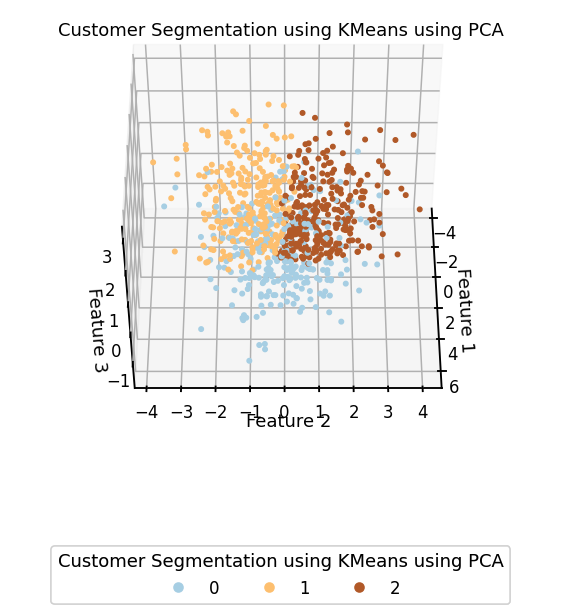

In [66]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df_XtransPCA.values[:,0:3]

ax.set_title("Customer Segmentation using KMeans using PCA")
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

g = ax.scatter(Xo[:, 0], Xo[:, 1], Xo[:, 2], c= km3_PCA.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using KMeans using PCA", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())


In [67]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=4): {silhouette_score(df_XtransPCA, km3_PCA.labels_)}')

Silhouette Score(n=4): 0.23598796824478227


**C. Using Kernel PCA as Dimensionality Reduction**

In [68]:
df_XtransKPCA = pd.DataFrame(X_transKPCA)
df_XtransKPCA.head()

,0,1,2,3
0,-0.278914,0.170748,0.105672,0.169444
1,0.636944,-0.018097,0.076872,-0.447027
2,0.550902,-0.314718,-0.012445,-0.114727
3,-0.493069,-0.069854,0.123727,0.080014
4,0.391926,-0.070968,0.267249,-0.454530


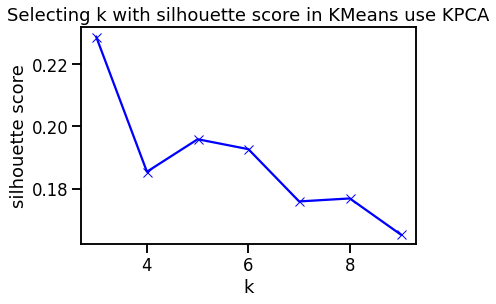

In [147]:
from sklearn.cluster import KMeans

meanDistortions=[]

for k in range(3, 10):
    kmeans_model = KMeans(n_clusters=k, random_state=42)
    kmeans_model.fit(df_XtransKPCA)
    prediction=kmeans_model.labels_
    meanDistortions.append(silhouette_score(df_XtransPCA, prediction))


plt.plot(range(3, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in KMeans use KPCA');

In [72]:
from sklearn.cluster import KMeans
### BEGIN SOLUTION

km3_KPCA = KMeans(n_clusters=3, random_state=42)
km3_KPCA = km3_KPCA.fit(df_XtransKPCA)

df['kmeans_KPCA'] = km3_KPCA.predict(df_XtransKPCA)


In [73]:
df

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,0,2,2
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,2,0,1
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,2,0,1
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,1,0
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...
845,846,-0.999093,-0.829152,-0.162009,-0.639196,-0.578573,-0.616000,-0.271993,1,1,0
846,847,-0.874664,0.495768,0.159213,-0.193222,-0.813340,-0.123986,-0.232226,0,2,2
847,848,-1.247951,2.164970,-2.162661,-1.243079,1.041465,0.406029,2.058842,1,1,0
848,849,-0.376947,-0.829152,0.701324,-0.516392,-1.168512,-1.045976,-1.360729,0,2,2


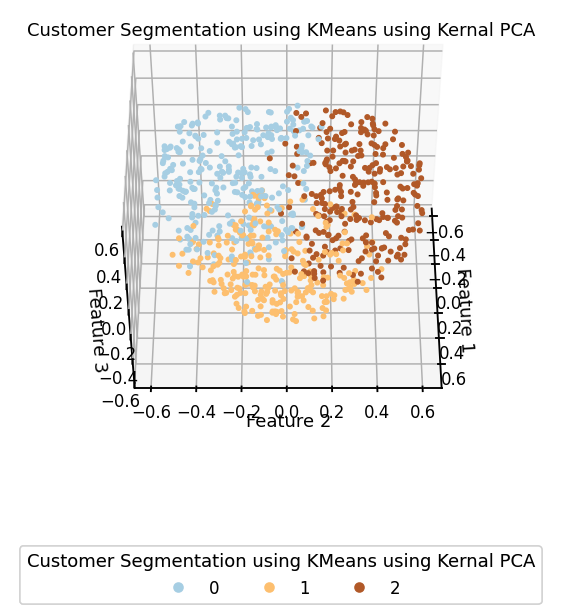

In [74]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df_XtransKPCA.values[:,0:3]

ax.set_title("Customer Segmentation using KMeans using Kernal PCA")
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

g = ax.scatter(Xo[:, 0], Xo[:, 1], Xo[:, 2], c= km3_KPCA.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using KMeans using Kernal PCA", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())



In [77]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=3): {silhouette_score(df_XtransKPCA, km3_KPCA.labels_)}') #kpca

Silhouette Score(n=3): 0.26985126588627484


In [221]:
from sklearn.cluster import KMeans
### BEGIN SOLUTION

km5_KPCA = KMeans(n_clusters=5, random_state=42)
km5_KPCA = km5_KPCA.fit(df_XtransKPCA)

df['kmeans_KPCA5'] = km5_KPCA.predict(df_XtransKPCA)


EXTRAS : when cluster = 5

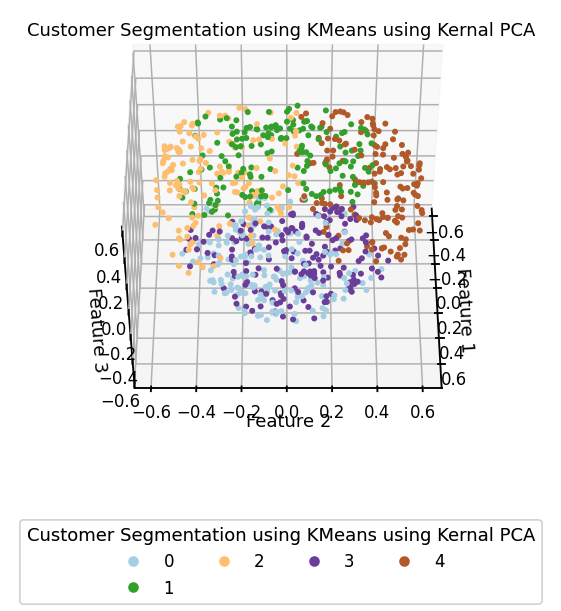

In [202]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df_XtransKPCA.values[:,0:3]

ax.set_title("Customer Segmentation using KMeans using Kernal PCA")
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

g = ax.scatter(Xo[:, 0], Xo[:, 1], Xo[:, 2], c= km5_KPCA.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using KMeans using Kernal PCA", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())



In [203]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(n=2): {silhouette_score(df_XtransKPCA, km5_KPCA.labels_)}') #kpca

Silhouette Score(n=2): 0.27492678459056474


In [83]:
df.head()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,0,2,2
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,2,0,1
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,2,0,1
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,1,0
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,2,0,1


Seeing the difference result between 3 acts: KMeans without using dimensionality reduction, KMeans using PCA as Dimensionality Reduction, and KMeans using Kernel PCA, turned out Kernel PCA is the best Dimensionality Reduction method since the Silhouette Score is outperformed other and also we can see from the 3D animation of its clustering result, that each cluster's is highly dense with well separated amongst clusters. It is highly congruent with theory: when clusters are dense and well separated, which relates to a standard concept of a cluster.

In [86]:
#another way to count and see the difference between 2 clustering method
(df[['kmeans','kmeans_KPCA','kmeans_PCA']]
 .groupby(['kmeans_KPCA'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
kmeans_KPCA,
0,299
1,275
2,276


In [87]:
(df[['kmeans','kmeans_KPCA','kmeans_PCA']]
 .groupby(['kmeans_PCA'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
kmeans_PCA,
0,269
1,286
2,295


In [88]:
(df[['kmeans','kmeans_KPCA','kmeans_PCA']]
 .groupby(['kmeans'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
kmeans,
0,301
1,280
2,269


## 2. Hierarchical Agglomerative Clustering Model

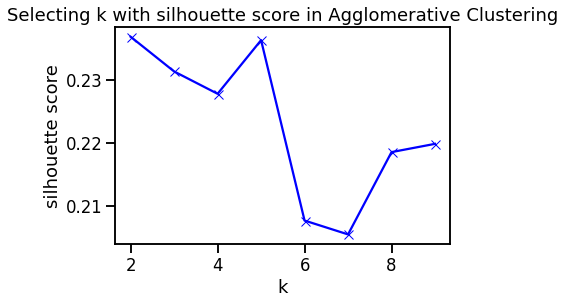

In [89]:
from sklearn.cluster import AgglomerativeClustering

meanDistortions=[]

for k in range(2, 10):
    ag_model=AgglomerativeClustering(n_clusters=k, affinity='euclidean',  linkage='ward')
    ag_model.fit(df_XtransKPCA)
    prediction=ag_model.labels_
    meanDistortions.append(silhouette_score(df_XtransKPCA, prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting k with silhouette score in Agglomerative Clustering');

In [90]:
from sklearn.cluster import AgglomerativeClustering
### BEGIN SOLUTION

ag_model=AgglomerativeClustering(n_clusters=5, affinity='euclidean',  linkage='ward')
ag_model.fit(df_XtransKPCA)
    
df['agglom'] = ag_model.fit_predict(df)

In [91]:
df

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA,agglom
0,1,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052,0,2,2,3
1,2,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170,2,0,1,3
2,3,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555,2,0,1,3
3,4,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052,1,1,0,3
4,5,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441,2,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...
845,846,-0.999093,-0.829152,-0.162009,-0.639196,-0.578573,-0.616000,-0.271993,1,1,0,4
846,847,-0.874664,0.495768,0.159213,-0.193222,-0.813340,-0.123986,-0.232226,0,2,2,4
847,848,-1.247951,2.164970,-2.162661,-1.243079,1.041465,0.406029,2.058842,1,1,0,4
848,849,-0.376947,-0.829152,0.701324,-0.516392,-1.168512,-1.045976,-1.360729,0,2,2,4


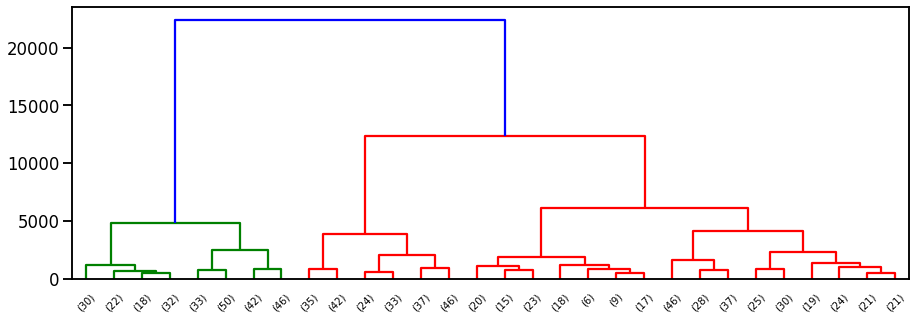

In [93]:
# First, we import the cluster hierarchy module from SciPy (described above) to obtain the linkage and dendrogram functions.
from scipy.cluster import hierarchy

Z = hierarchy.linkage(ag_model.children_, method='ward')

fig, ax = plt.subplots(figsize=(15,5))


den = hierarchy.dendrogram(Z, orientation='top', 
                           p=30, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax)
### END SOLUTION

In [94]:
  ag_model=AgglomerativeClustering(n_clusters=5, affinity='euclidean',  linkage='ward')
  ag_model.fit(df_XtransKPCA)
  prediction=ag_model.labels_
  
print(f'Silhouette Score(n=5): {silhouette_score(df_XtransKPCA, prediction)}')

Silhouette Score(n=5): 0.23637687341729402


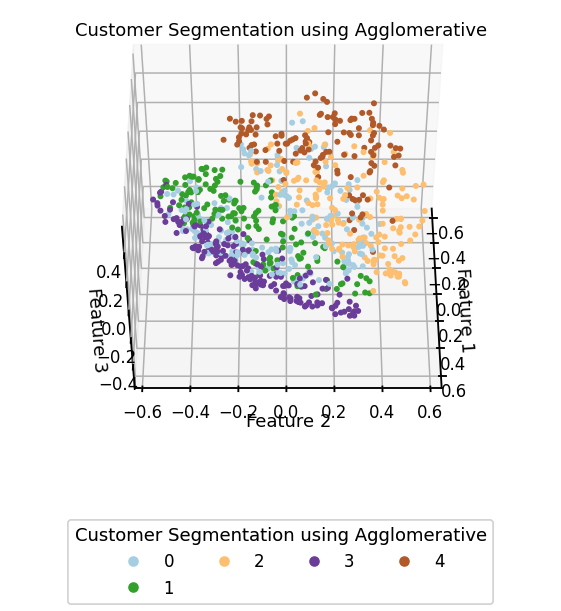

In [95]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df_XtransKPCA.values[:,::]

ax.set_title("Customer Segmentation using Agglomerative")
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')

g = ax.scatter(Xo[:, 1], Xo[:, 2], Xo[:, 3], c= ag_model.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using Agglomerative", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

#plt.show()

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())



In [96]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans_KPCA']]
 .groupby(['agglom'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
agglom,
0,224
1,159
2,183
3,132
4,152


## 3. DBScan (Density Based Spatial Clustering Applications with Noise)

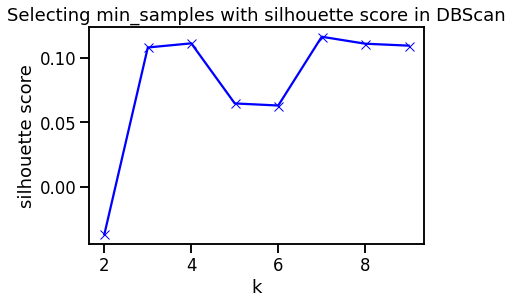

In [102]:
from sklearn.cluster import DBSCAN


meanDistortions=[]

for min_samples in range(2, 10):
    DBScan_model = DBSCAN(eps=1.3, min_samples=min_samples)
    DB = DBScan_model.fit(df[float_columns])
    prediction = DB.labels_
    meanDistortions.append(silhouette_score(df[float_columns], prediction))


plt.plot(range(2, 10), meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('silhouette score')
plt.title('Selecting min_samples with silhouette score in DBScan');

In [98]:
DBScan_model = DBSCAN(eps=1.3, min_samples=3)
DB = DBScan_model.fit(df[float_columns])
prediction = DB.labels_
df['DBScan'] = prediction

In [99]:
df['DBScan'].value_counts()

 1    445
 0    352
-1     46
 3      4
 2      3
Name: DBScan, dtype: int64

In [100]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans','DBScan']]
 .groupby(['DBScan'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
DBScan,
-1,46
0,352
1,445
2,3
3,4


In [328]:
df[float_columns].head()

,Age,Edu,Years Employed,Income,Card Debt,Other Debt,DebtIncomeRatio
0,0.742915,0.495768,0.010114,-1.154930,-1.155634,-0.725413,-0.376052
1,1.489490,-0.829152,1.517422,1.628014,1.733823,1.657614,0.624170
2,-0.252518,0.495768,0.514794,0.674792,2.170302,1.172210,1.349555
3,-0.750235,0.495768,-0.365586,-1.154930,-0.429967,-1.225158,-0.376052
4,1.489490,-0.829152,1.707129,3.212853,2.839686,1.772895,-0.193441


In [346]:
DB_labels = DB.labels_

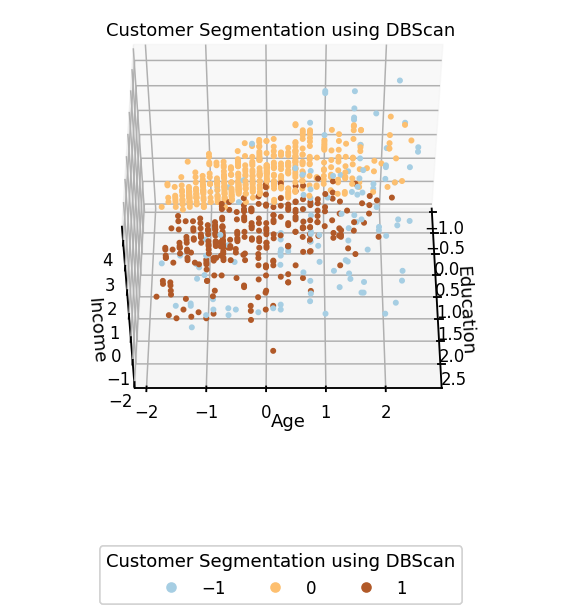

In [103]:
# 3D CLUSTERED MAPPING USING DBScan

from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)
plt.cla()
Xo = df[float_columns].values[:,::]

ax.set_title('Customer Segmentation using DBScan')
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 1], Xo[:, 0], Xo[:, 3], c= DB.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')



# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using DBScan", borderaxespad=-10, ncol=4)
ax.add_artist(legend)


from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)
#ani.save('Cluster_plot.gif', writer=animation.PillowWriter(fps=25));

HTML(ani.to_html5_video())

In [105]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(min sampes=3): {silhouette_score(df[float_columns], DB.labels_)}')

Silhouette Score(min sampes=3): 0.10934538670309163


## 4. Mean Shift Model


In [114]:
from sklearn.cluster import MeanShift

MS = MeanShift(bandwidth=2)
MS = MS.fit(df[float_columns])
df['MS'] = MS.fit_predict(df[float_columns])


In [115]:
df['MS'].value_counts()

0    764
1     69
2     17
Name: MS, dtype: int64

In [ ]:
#another way to count and see the difference between 2 clustering method
(df[['agglom','kmeans','DBScan', 'MS']]
 .groupby(['MS'])
 .size()
 .to_frame()
 .rename(columns={0:'number'}))

,number
MS,
0,764
1,69
2,17


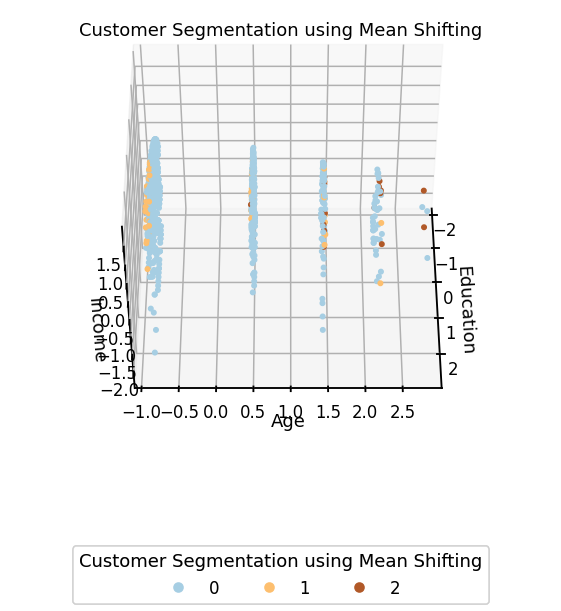

In [118]:
from mpl_toolkits.mplot3d import axes3d
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.animation as animation


fig = plt.figure(1, figsize=(8, 6))
plt.clf()
ax = Axes3D(fig, rect=[0, 0, .95, 1], elev=48, azim=134)

Xo = df[float_columns].values[:,::]


ax.set_title("Customer Segmentation using Mean Shifting")
ax.set_xlabel('Education')
ax.set_ylabel('Age')
ax.set_zlabel('Income')

g = ax.scatter(Xo[:, 0], Xo[:, 1], Xo[:, 2], c= MS.labels_.astype(np.float), marker='o', depthshade=False, cmap='Paired')


# produce a legend with the unique colors from the scatter
legend = ax.legend(*g.legend_elements(), loc="lower center", title="Customer Segmentation using Mean Shifting", borderaxespad=-10, ncol=4)
ax.add_artist(legend)

from matplotlib import animation

def rotate(angle):
     ax.view_init(azim=angle)

angle = 1
ani = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 360, angle), interval=15)

HTML(ani.to_html5_video())

In [120]:
from sklearn.metrics import silhouette_score
print(f'Silhouette Score(bandwidth=2): {silhouette_score(df[float_columns], MS.labels_)}')

Silhouette Score(bandwidth=2): 0.27151325153067096


# Intuitive Meaning from Clustering Result

In [132]:
data['kmeans']=df['kmeans']
data['kmeans_PCA']=df['kmeans_PCA']
data['kmeans_KPCA']=df['kmeans_KPCA']
data['agglom']=df['agglom']
data['MS']=df['MS']
data['DBScan']=df['DBScan']

In [133]:
data.groupby('kmeans').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans_PCA,kmeans_KPCA,agglom,MS,DBScan
kmeans,,,,,,,,,,,,,,
0,427.292359,35.548173,1.468439,9.355482,40.112957,0.571478,1.245990,0.074803,4.825914,1.980066,1.784053,1.747508,0.0000,0.634551
1,436.007143,29.189286,1.807143,2.660714,24.525000,0.958404,1.948004,0.428571,12.029286,1.000000,0.060714,1.932143,0.0000,0.435714
2,412.557621,40.527881,1.881041,13.828996,77.074349,3.345461,6.306591,0.302326,14.219703,0.000000,1.014870,1.717472,0.3829,0.386617


In [134]:
data.groupby('kmeans_PCA').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,kmeans_KPCA,agglom,MS,DBScan
kmeans_PCA,,,,,,,,,,,,,,
0,412.557621,40.527881,1.881041,13.828996,77.074349,3.345461,6.306591,0.302326,14.219703,2.000000,1.014870,1.717472,0.3829,0.386617
1,434.611888,29.101399,1.797203,2.688811,24.451049,0.944007,1.921626,0.423077,11.871329,0.979021,0.059441,1.919580,0.0000,0.440559
2,428.467797,35.762712,1.471186,9.464407,40.501695,0.577566,1.257285,0.075697,4.832542,0.000000,1.820339,1.755932,0.0000,0.633898


In [135]:
data.groupby('kmeans_KPCA').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,kmeans_PCA,agglom,MS,DBScan
kmeans_KPCA,,,,,,,,,,,,,,
0,423.775920,28.772575,1.792642,2.602007,24.043478,0.835391,1.752304,0.404000,10.886957,0.892977,1.086957,1.856187,0.000000,0.448161
1,416.985455,40.469091,1.854545,13.621818,76.138182,3.338898,6.246305,0.307339,14.468727,1.960000,0.040000,1.760000,0.374545,0.389091
2,435.851449,36.387681,1.478261,9.989130,41.836957,0.624341,1.359725,0.064655,5.115217,0.043478,1.956522,1.775362,0.000000,0.637681


In [136]:
data.groupby('agglom').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA,MS,DBScan
agglom,,,,,,,,,,,,,,
0,244.5,35.035714,1.696429,8.968750,45.102679,1.603187,2.923022,0.251366,9.821429,0.924107,1.062500,0.995536,0.093750,0.504464
1,619.0,35.547170,1.691824,8.773585,49.867925,1.515094,3.235145,0.274809,9.804403,0.955975,1.037736,1.069182,0.150943,0.490566
2,448.0,35.491803,1.688525,8.426230,46.830601,1.750415,3.386372,0.320513,11.363934,1.087432,0.912568,0.857923,0.163934,0.491803
3,66.5,34.477273,1.787879,8.484848,48.454545,1.425879,3.088455,0.233010,9.650758,0.946970,1.045455,0.969697,0.121212,0.477273
4,774.5,34.401316,1.710526,7.993421,43.921053,1.524612,2.765987,0.212598,10.088816,0.888158,1.105263,0.980263,0.078947,0.480263


In [137]:
data.groupby('DBScan').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA,agglom,MS
DBScan,,,,,,,,,,,,,,
-1,419.413043,42.195652,2.956522,8.608696,97.978261,3.532783,5.894913,0.459459,12.571739,1.434783,0.565217,0.804348,1.543478,0.543478
0,422.386364,34.031250,2.460227,7.443182,48.500000,1.534861,3.181011,0.303030,9.996875,1.073864,0.920455,0.866477,1.875000,0.119318
1,429.251685,34.862921,1.000000,9.128090,37.593258,1.238683,2.488364,0.201657,9.931236,0.808989,1.182022,1.074157,1.770787,0.065169
2,451.333333,47.666667,1.000000,29.333333,277.000000,7.787667,12.363667,0.000000,7.300000,2.000000,0.000000,1.000000,2.666667,1.000000
3,332.750000,49.500000,1.000000,28.750000,133.750000,15.735250,20.415500,1.000000,26.850000,2.000000,0.000000,1.000000,0.500000,1.000000


In [138]:
data.groupby('MS').mean()

,Customer Id,Age,Edu,Years Employed,Income,Card Debt,Other Debt,Defaulted,DebtIncomeRatio,kmeans,kmeans_PCA,kmeans_KPCA,agglom,DBScan
MS,,,,,,,,,,,,,,
0,424.714660,34.090314,1.674084,7.583770,39.146597,1.090860,2.320893,0.251592,9.476309,0.84555,1.146597,0.969895,1.799738,0.502618
1,443.942029,43.724638,1.666667,18.405797,94.971014,5.874696,9.375638,0.338983,17.894203,2.00000,0.000000,1.000000,1.855072,0.637681
2,385.941176,41.941176,3.529412,12.764706,189.000000,5.972118,11.580941,0.384615,10.076471,2.00000,0.000000,1.000000,1.529412,-0.647059
